# Intro to cartopy: The very basics

- cartopy is a fun library for making pretty maps!
- Can use with good old geopandas
- Can do things like graticules, Tissot's indicatrix, etc.

- Based on our core PROJ, numpy and shapely libraries
- Plotting through matplotlib

- Object-oriented projection definitions: Easily transforms vectors between projections

<img src="cartopy.png" alt="drawing" style="width:245px;"/>

For documentation see:

- https://scitools.org.uk/cartopy/docs/latest/

Let's introduce the basics here...

In [50]:
#First grab basic libraries
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import geopandas as gpd

## Minimal map

- The `cartopy.crs.CRS` class is at the core of cartopy
- Let's construct a very simple map using different projections

In [51]:
##First import:
import cartopy.crs as ccrs

cartopy.mpl.geoaxes.GeoAxesSubplot

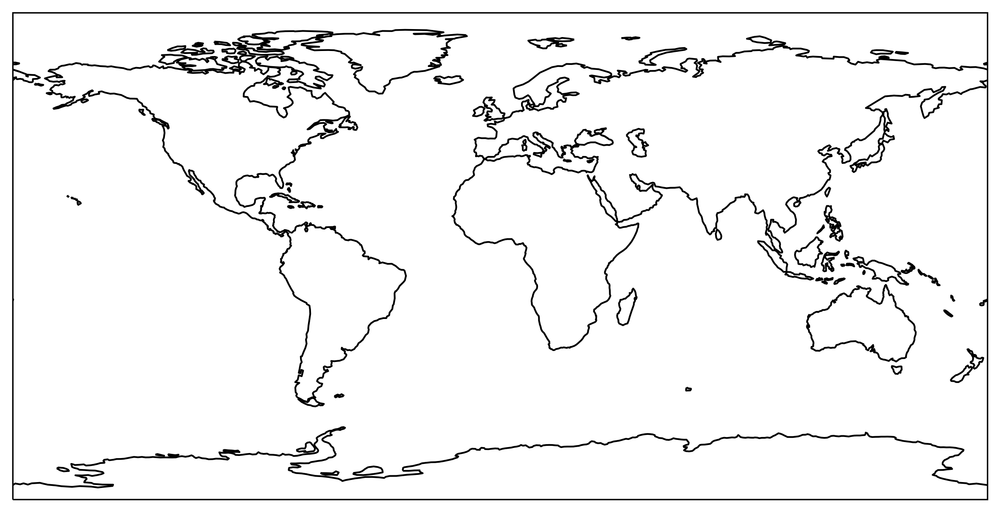

In [52]:
fig = plt.figure(1, figsize=[10,5], dpi=300)

# Create a GeoAxesSubplot Object:
# Set the projection to use for plotting
ax1 = plt.subplot(1, 1, 1, projection=ccrs.PlateCarree())


#Use cartopy to add coastlines
ax1.coastlines()

#Note the type:
type(ax1)

### Let's do a few different projections

- For a full list, see: https://scitools.org.uk/cartopy/docs/latest/reference/projections.html#cartopy-projections
        

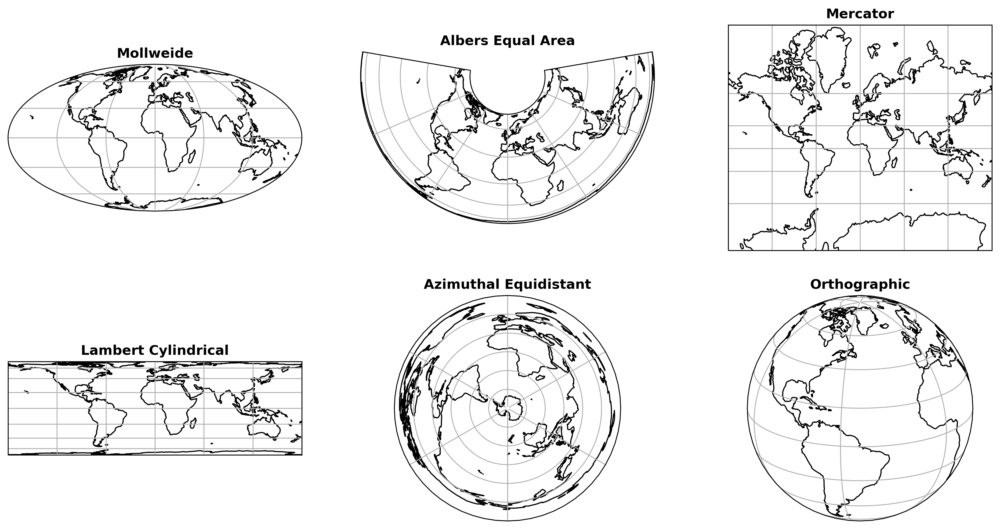

In [54]:
## Let's do few different projections:
###

fig = plt.figure(1, figsize=[16,8], dpi=300)

projection_list = [ccrs.Mollweide(),
                   ccrs.AlbersEqualArea(),
                   ccrs.Mercator(),
                   ccrs.LambertCylindrical(central_longitude=0.0),
                   ccrs.AzimuthalEquidistant(central_longitude=0.0, central_latitude=-90.0),
                   ccrs.Orthographic(central_longitude=-50.0, central_latitude=20.0)]


title_list = ['Mollweide', 'Albers Equal Area', 'Mercator', 'Lambert Cylindrical', 'Azimuthal Equidistant', 'Orthographic']

for i in range(6):
    ax1 = plt.subplot(2, 3, i+1, projection=projection_list[i])
    
    #Coastlines
    ax1.coastlines()
    
    #Gridlines: Just use defaults for now
    ax1.gridlines()
    
    ax1.set_title(title_list[i], fontweight='bold')

### Let's plot a couple points/lines:

- Depict Phoenix to London

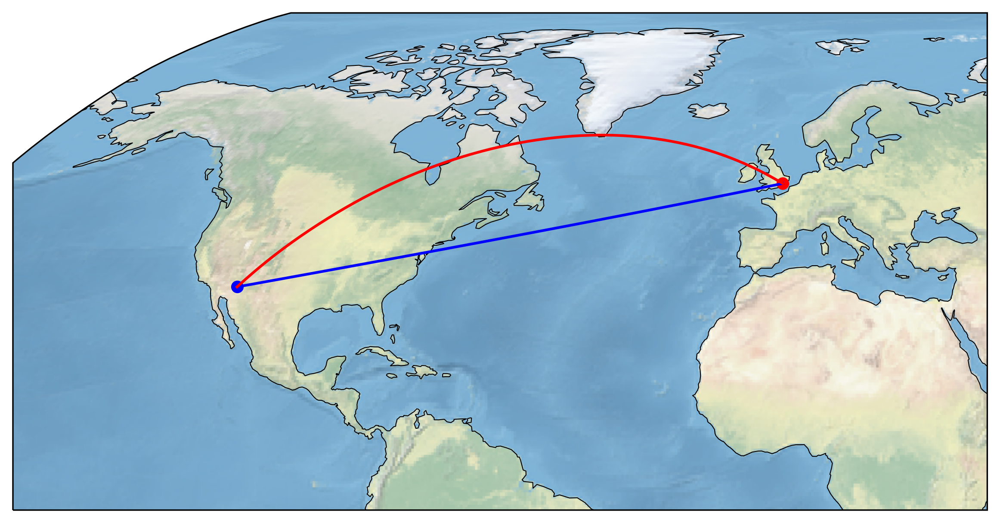

In [58]:
#Change our threshold for a finer-resolution plot:
my_crs = ccrs.Robinson()
my_crs._threshold = my_crs._threshold/100


#Make our GeoAxes: Another way
fig, ax1 = plt.subplots(1, 1, figsize=[10,5], dpi=300,
                    subplot_kw={'projection': my_crs})

ax1.coastlines(linewidth=.5)

#This time, let's add the stock background image too:
ax1.stock_img()


#Plot two points: We'll just use Phoenix and London
origin = [-112.0740, 33.4484] #Phoenix
dest = [0.1276, 51.5072] #London


#Could also use, say:
#dest = [139.6503, 35.6762] #Tokyo
#dest = [30.5234, 50.4501] #Kyiv
#dest = [38.7578, 8.9806] #Addis Abada
#dest = [151.2093, -33.8688] #Sydney
#dest = [-104.9903, 39.7392] #Denver

#Plot our origin and destination points:
ax1.plot(origin[0], origin[1], 'o', color='blue', transform=ccrs.PlateCarree())
ax1.plot(dest[0], dest[1], 'o', color='red', transform=ccrs.PlateCarree())


#Plot course between as a straight line:
ax1.plot([origin[0], dest[0]], [origin[1], dest[1]], color='blue', transform=ccrs.PlateCarree())


#Using Geodetic coordinates: Gives great circle shortest distance
ax1.plot([origin[0], dest[0]], [origin[1], dest[1]], color='red', transform=ccrs.Geodetic());


#Could restrict our extent a little:
extent = [-150, 40, -5, 90]  # [min lon, max lon, min lat, max lat]
ax1.set_extent(extent, crs=ccrs.PlateCarree())


### How to calculate distance?

- We can see from above that just using distance in a projected CRS will not generally be correct

- We have (at least) two options:

    - Use an equidistant projection, or
    - Calculate the length of geometry using the `Geodesic` class
    

In [59]:
## 1. Use an equidistant projection:

#Let's get distance from Phoenix, AZ:
#Make an AzimuthalEquidistant projection centered on Phoenix (origin)
Phx_crs = ccrs.AzimuthalEquidistant(central_longitude=origin[0], central_latitude=origin[1])


#Now, transform a point representing London (dest):
#We will have in meters:
London_coords = Phx_crs.transform_point(dest[0], dest[1], ccrs.PlateCarree())

#What did we get?
print(London_coords)

#Distance from origin in miles is just:
#(and converting from meters to miles)
np.sqrt(London_coords[0]**2 + London_coords[1]**2) / 1e3 / 1.60934

(5050419.881448741, 6855850.0961658275)


5291.141968568705

In [60]:
## 2. Use Geodesic class:

from cartopy.geodesic import Geodesic

#Make a shapely LineString object:
from shapely import LineString

ls = LineString([origin, dest])

#Grab an Geodisic object:
geod = Geodesic()

# Calculate the distance between the two points
distance = geod.geometry_length(ls)

#In miles: Note that equals above to about 10 decimal points
distance / 1e3 / 1.60934

5291.141968568713

## Incorporate Geopandas

- It's pretty straightforward to plot geopandas objects in a cartopy GeoAxis...

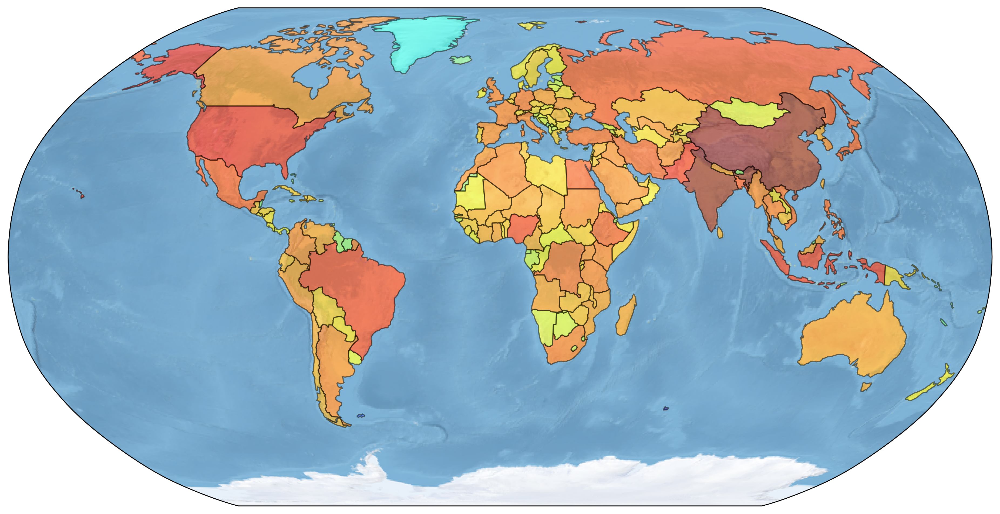

In [62]:
#Just get built-in natural earth again:
gdf = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

#Exclude Antarctica
gdf = gdf.loc[gdf.continent != 'Antarctica']



#Let's just use "my_crs" to more easily change:
#my_crs = ccrs.Mollweide()
my_crs = ccrs.Robinson()

#Make GeoAxesSubplot
fig, ax1 = plt.subplots(1, 1, figsize=[16,8], dpi=300,
                    subplot_kw={'projection': my_crs})
#Stock image
ax1.stock_img()


#Since ccrs.CRS objects are just pyproj projections, we can use them directly to change the CRS of a GeoDataFrame:
gdf = gdf.to_crs(my_crs)

#Use log of population to color our choropleth map:
gdf.plot(ax=ax1, column=np.log(gdf.pop_est), alpha=.5, edgecolor='black', cmap='jet');

#### Let's use centroids this time:


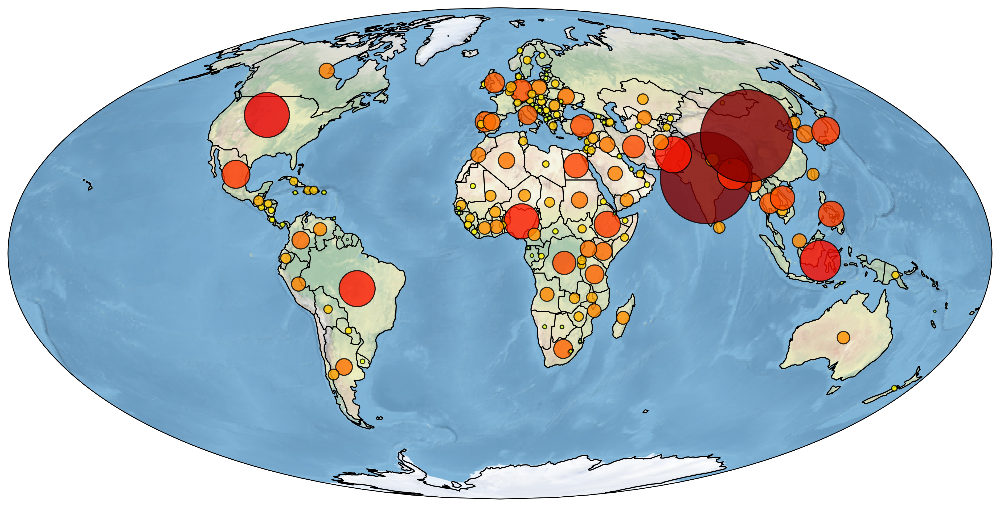

In [65]:
#Again...
#Using my_crs for ease:
my_crs = ccrs.Mollweide()

#Make GeoAxesSubplot
fig, ax1 = plt.subplots(1, 1, figsize=[16,8], dpi=300,
                    subplot_kw={'projection': my_crs})
#Stock image
ax1.stock_img()


#Let's add the BORDERS feature here:
import cartopy.feature as cf
ax1.add_feature(cf.BORDERS)

#Looks better with this too:
ax1.coastlines()


#Since ccrs.CRS objects are just pyproj projections, we can use them directly to change the CRS of a GeoDataFrame:
gdf = gdf.to_crs(my_crs)

#Make the centroids
gdf['cent'] = gdf.centroid
gdf = gdf.set_geometry('cent')

#Use regular ole population for markersize, color by log
#Set zorder to make sure we're on top
gdf.plot(ax=ax1, column=np.log(gdf.pop_est), markersize=gdf.pop_est / 2e5, alpha=.8, edgecolor='black', cmap='jet', zorder=10);

## More cartopy features

- There are several other features we can add to our map to make it pretty as possible...

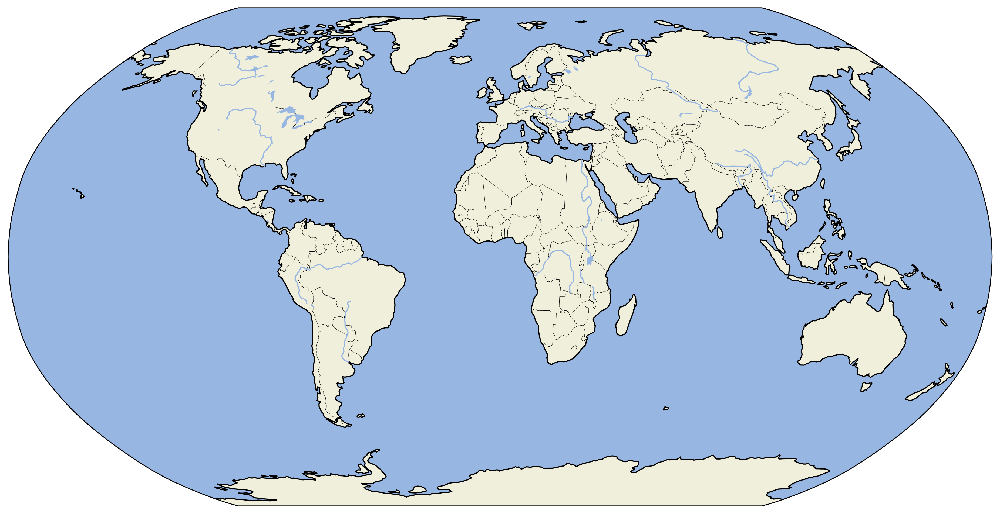

In [69]:
import cartopy.feature as cf

my_crs = ccrs.Robinson()

#Make GeoAxesSubplot
fig, ax1 = plt.subplots(1, 1, figsize=[16,8], dpi=300,
                    subplot_kw={'projection': my_crs})


ax1.add_feature(cf.LAND)
ax1.add_feature(cf.OCEAN)
ax1.add_feature(cf.COASTLINE)

if (1):
    ax1.add_feature(cf.BORDERS, linestyle='-', linewidth=.25)
if (1):
    ax1.add_feature(cf.LAKES, alpha=1)
if (1):
    ax1.add_feature(cf.RIVERS)

## Graticules, Tissot's Indicatrix

- We can visualize the distortions various projections create by looking at the graticules as well as Tissot's indicatrix

- For example...

In [70]:
#Let's suppress warnings real quick
import warnings

# Just suppress 'em all, it'll be fine
warnings.filterwarnings("ignore")


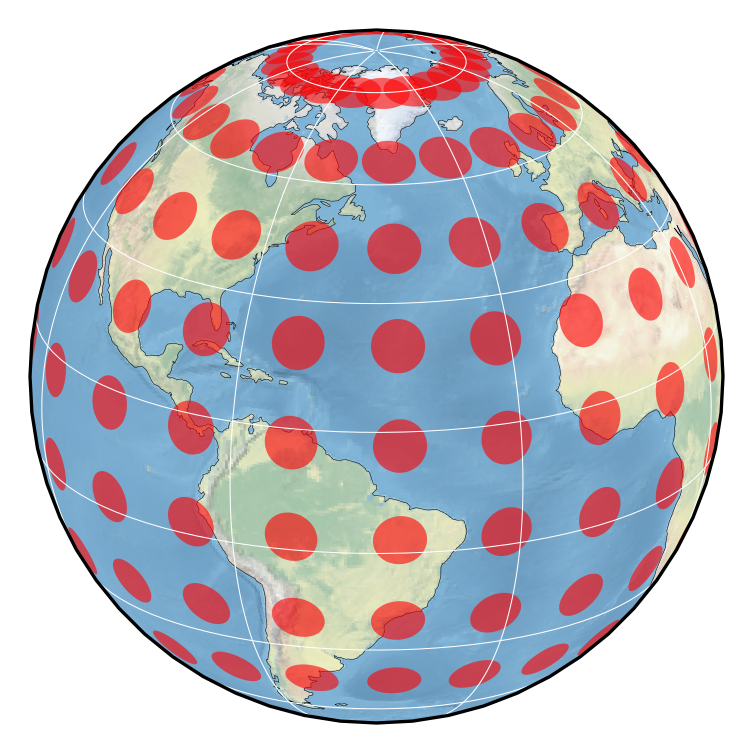

In [75]:

#Let's use the projection list from above, throw in Robinson too
projection_list = [ccrs.Robinson(),
                   ccrs.Mollweide(),
                   ccrs.AlbersEqualArea(),
                   ccrs.Mercator(),
                   ccrs.LambertCylindrical(central_longitude=0.0),
                   ccrs.AzimuthalEquidistant(central_longitude=0.0, central_latitude=90.0),
                   ccrs.Orthographic(central_longitude=-50.0, central_latitude=20.0)]


fig, ax1 = plt.subplots(1, 1, figsize=[3,3], dpi=300,
                    subplot_kw={'projection': projection_list[6]})

ax1.stock_img()
ax1.add_feature(cf.COASTLINE, linewidth=.125)

#Tissot's indicatrix
#########
ax1.tissot(facecolor='red', alpha=0.6, lats=np.linspace(-75,75,10), lons = np.linspace(-175,175,20)) #Set lons to 20 for orthographic

#Add gridlines as well:
#########

ax1.gridlines(draw_labels=False, linewidth=.25, color='white', alpha=1, linestyle='-',
             ylocs=np.linspace(-75,75,8), xlocs=np.linspace(-175,175,8));

#ax1.gridlines(draw_labels=False, linewidth=.25, color='white', alpha=1, linestyle='-',
#             xlocs=np.arange(-180, 181, 20), ylocs=np.arange(-89, 90, 20));
